In [1]:
%matplotlib inline
import copy
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from p2ch12.dsets import getNoduleInfoList, getCt
from util.util import xyz2irc

noduleInfo_list = getNoduleInfoList(requireDataOnDisk_bool=False)
noduleInfo_list[0]

NoduleInfoTuple(isMalignant_bool=True, diameter_mm=32.27003025, series_uid='1.3.6.1.4.1.14519.5.2.1.6279.6001.287966244644280690737019247886', center_xyz=(67.61451718, 85.02525992, -109.8084416))

In [3]:
series_list = sorted(set(t.series_uid for t in noduleInfo_list))
row_min = 999
col_min = 999
row_max = 0
col_max = 0

# This will take a while to run!
#for series_uid in series_list:
#    ct = getCt(series_uid)
#    row_min = min(ct.maskMin_irc.row, row_min)
#    col_min = min(ct.maskMin_irc.col, col_min)
#    row_max = max(ct.maskMax_irc.row, row_max)
#    col_max = max(ct.maskMax_irc.col, col_max)
  
# print(series_uid, row_min, col_min, row_max, col_max)
    

In [11]:
def transparent_cmap(cmap, N=255):
    "Copy colormap and set alpha values"

    mycmap = copy.deepcopy(cmap)
    mycmap._init()
    mycmap._lut[:,-1] = np.linspace(0, 0.75, N+4)
    return mycmap
tgray = transparent_cmap(plt.cm.gray)
tpurp = transparent_cmap(plt.cm.Purples)
tblue = transparent_cmap(plt.cm.Blues)
tgreen = transparent_cmap(plt.cm.Greens)
torange = transparent_cmap(plt.cm.Oranges)
tred = transparent_cmap(plt.cm.Reds)


clim=(0, 1.3)
layer_list = [
    ('dense_mask', lambda ct: ct.dense_mask), 
    ('denoise_mask', lambda ct: ct.denoise_mask),
    ('tissue_mask', lambda ct: ct.tissue_mask), 
    ('body_mask', lambda ct: ct.body_mask), 
    ('air_mask', lambda ct: ct.air_mask), 
    ('lung_mask', lambda ct: ct.lung_mask), 
    ('benign_mask', lambda ct: ct.benign_mask), 
    ('malignant_mask', lambda ct: ct.malignant_mask), 
]
start_ndx = 3
layer_list = [
    ('dense_mask', lambda ct, tup, ndx: tup[2]), 
    ('denoise_mask', lambda ct, tup, ndx: tup[3]),
    ('tissue_mask', lambda ct, tup, ndx: tup[4]), 
    ('body_mask', lambda ct, tup, ndx: tup[5]), 
    ('air_mask', lambda ct, tup, ndx: tup[0]), 
    ('lung_mask', lambda ct, tup, ndx: tup[1]), 
    ('benign_mask', lambda ct, tup, ndx: ct.benign_mask[ndx]), 
    ('altben_mask', lambda ct, tup, ndx: tup[6]),
    ('malignant_mask', lambda ct, tup, ndx: ct.malignant_mask[ndx]),     
]


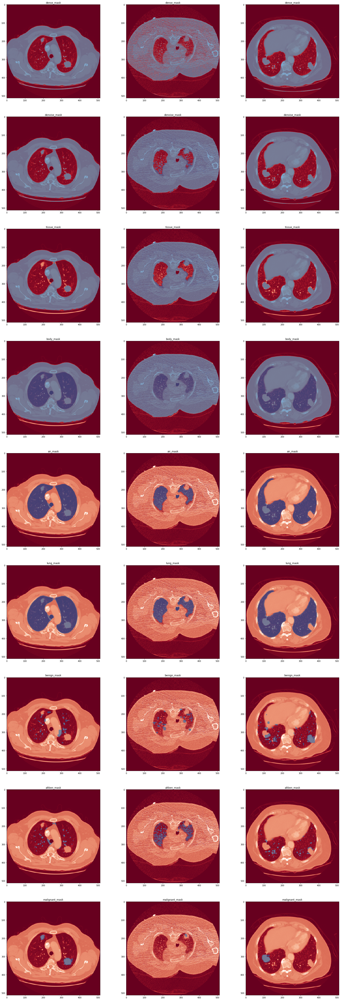

In [12]:
ct_list = []
for nit_ndx in range(start_ndx, start_ndx+3):
    noduleInfo_tup = noduleInfo_list[nit_ndx]
    ct = getCt(noduleInfo_tup.series_uid)
    center_irc = xyz2irc(noduleInfo_tup.center_xyz, ct.origin_xyz, ct.vxSize_xyz, ct.direction_tup)
    
    ct_list.append((ct, center_irc))
start_ndx = nit_ndx + 1

fig = plt.figure(figsize=(30,90))
subplot_ndx = 0 
for title_str, layer_func in layer_list:
    for ct, center_irc in ct_list:    

        mask_tup = ct.build2dLungMask(int(center_irc.index))

        subplot_ndx += 1
        subplot = fig.add_subplot(len(layer_list), len(ct_list), subplot_ndx)
        subplot.set_title(title_str)

        #print(layer_func, ct.ary.shape, layer_func(ct, mask_tup, int(center_irc.index)).shape, center_irc.index)

        plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='RdGy')
        plt.imshow(layer_func(ct, mask_tup, int(center_irc.index)), clim=clim, cmap=tblue)


In [6]:
nit_ndx = 0
noduleInfo_tup = noduleInfo_list[nit_ndx]
ct = getCt(noduleInfo_tup.series_uid)
center_irc = xyz2irc(noduleInfo_tup.center_xyz, ct.origin_xyz, ct.vxSize_xyz, ct.direction_tup)
print(noduleInfo_tup, 'center_irc', center_irc)

mask_tup = ct.build2dLungMask(int(center_irc.index))




NoduleInfoTuple(isMalignant_bool=True, diameter_mm=32.27003025, series_uid='1.3.6.1.4.1.14519.5.2.1.6279.6001.287966244644280690737019247886', center_xyz=(67.61451718, 85.02525992, -109.8084416)) center_irc IrcTuple(index=91.27662336, row=359.6500497243522, col=341.1074155674705)


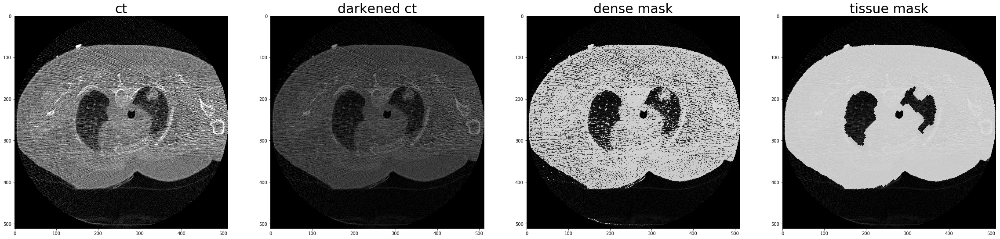

In [25]:
fig = plt.figure(figsize=(40,10))

subplot = fig.add_subplot(1, 4, 1)
subplot.set_title('ct', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 1000), cmap='gray')

subplot = fig.add_subplot(1, 4, 2)
subplot.set_title('darkened ct', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')

#subplot = fig.add_subplot(1, 4, 3)
#subplot.set_title('ct annotation example', fontsize=30)
#plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')

subplot = fig.add_subplot(1, 4, 3)
subplot.set_title('dense mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.dense_mask, clim=(0,1), cmap=tgray)

#subplot = fig.add_subplot(1, 3, 2)
#subplot.set_title('denoise mask', fontsize=30)
#plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
#plt.imshow(mask_tup.denoise_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 4)
subplot.set_title('tissue mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.tissue_mask, clim=(0,1), cmap=tgray)


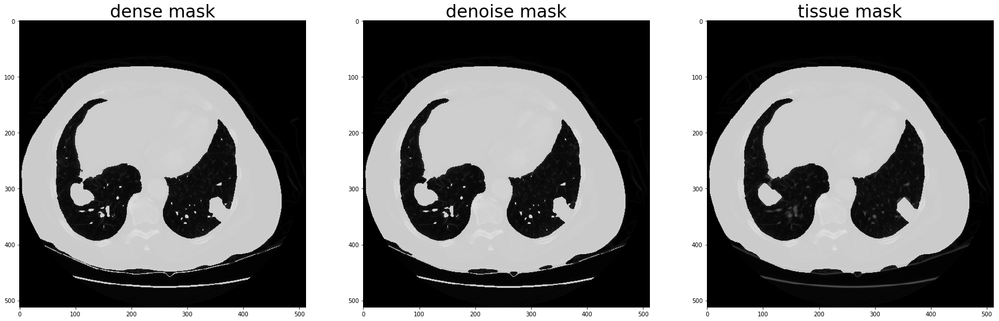

In [16]:
fig = plt.figure(figsize=(30,10))

subplot = fig.add_subplot(1, 3, 1)
subplot.set_title('dense mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.dense_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 3, 2)
subplot.set_title('denoise mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.denoise_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 3, 3)
subplot.set_title('tissue mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.tissue_mask, clim=(0,1), cmap=tgray)


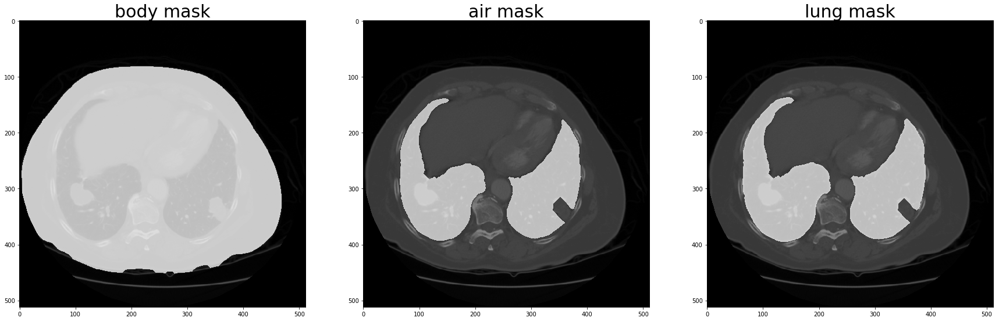

In [18]:
fig = plt.figure(figsize=(40,10))

subplot = fig.add_subplot(1, 3, 1)
subplot.set_title('body mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.body_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 3, 2)
subplot.set_title('air mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.air_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 3, 3)
subplot.set_title('lung mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.lung_mask, clim=(0,1), cmap=tgray)


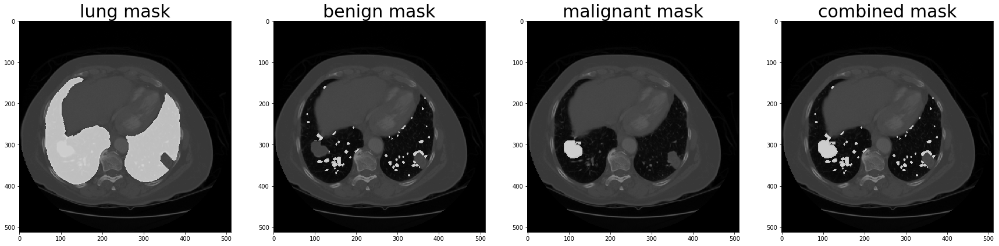

In [22]:
fig = plt.figure(figsize=(40,10))

subplot = fig.add_subplot(1, 4, 1)
subplot.set_title('lung mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.lung_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 2)
subplot.set_title('benign mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.ben_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 3)
subplot.set_title('malignant mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.mal_mask, clim=(0,1), cmap=tgray)

combined_mask = mask_tup.ben_mask | mask_tup.mal_mask
subplot = fig.add_subplot(1, 4, 4)
subplot.set_title('combined mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(combined_mask, clim=(0,1), cmap=tgray)


NoduleInfoTuple(isMalignant_bool=True, diameter_mm=27.44242293, series_uid='1.3.6.1.4.1.14519.5.2.1.6279.6001.943403138251347598519939390311', center_xyz=(-45.29440163, 74.86925386, -97.52812481)) center_irc IrcTuple(index=170.577500152, row=189.7025961171893, col=329.2666153338636)


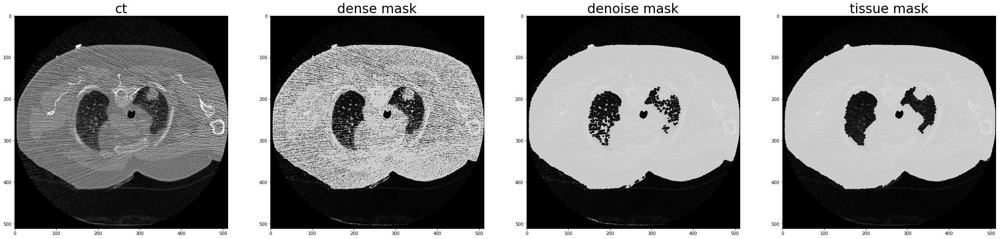

In [26]:
nit_ndx = 4
noduleInfo_tup = noduleInfo_list[nit_ndx]
ct = getCt(noduleInfo_tup.series_uid)
center_irc = xyz2irc(noduleInfo_tup.center_xyz, ct.origin_xyz, ct.vxSize_xyz, ct.direction_tup)
print(noduleInfo_tup, 'center_irc', center_irc)

mask_tup = ct.build2dLungMask(int(center_irc.index))


fig = plt.figure(figsize=(40,10))

subplot = fig.add_subplot(1, 4, 1)
subplot.set_title('ct', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 1000), cmap='gray')

subplot = fig.add_subplot(1, 4, 2)
subplot.set_title('dense mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.dense_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 3)
subplot.set_title('denoise mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.denoise_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 4)
subplot.set_title('tissue mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')
plt.imshow(mask_tup.tissue_mask, clim=(0,1), cmap=tgray)


In [41]:
from p2ch12.train_cls import LunaTrainingApp

cls_app = LunaTrainingApp(['--augmented', '--balanced'])
train_dl = cls_app.initTrainDl()

_ = train_dl.dataset[0]

2019-06-16 12:10:34,099 INFO     pid:15564 p2ch12.dsets:398:__init__ <p2ch12.dsets.LunaDataset object at 0x000001BD3ABE62E8>: 499470 training samples, 498285 ben, 1185 mal, 1:1 ratio


[2, tensor([0, 1]), '1.3.6.1.4.1.14519.5.2.1.6279.6001.479402560265137632920333093071', IrcTuple(index=130.84312257439998, row=289.02619457559115, col=88.31939154641091)]


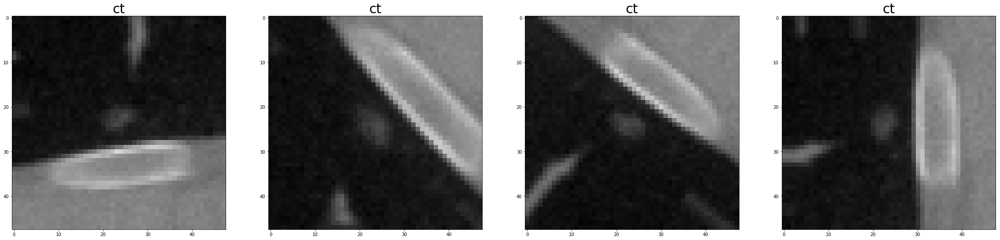

In [45]:
sample_ndx = 2
#while train_dl.dataset[sample_ndx][1][0]:
#    sample_ndx += 1

fig = plt.figure(figsize=(40,10))

nodule_tensor, malignant_tensor, series_uid, center_irc = train_dl.dataset[sample_ndx]
subplot = fig.add_subplot(1, 4, 1)
subplot.set_title('ct', fontsize=30)
plt.imshow(nodule_tensor[0,12], clim=(-1000, 1000), cmap='gray')

nodule_tensor, malignant_tensor, series_uid, center_irc = train_dl.dataset[sample_ndx]
subplot = fig.add_subplot(1, 4, 2)
subplot.set_title('ct', fontsize=30)
plt.imshow(nodule_tensor[0,12], clim=(-1000, 1000), cmap='gray')

nodule_tensor, malignant_tensor, series_uid, center_irc = train_dl.dataset[sample_ndx]
subplot = fig.add_subplot(1, 4, 3)
subplot.set_title('ct', fontsize=30)
plt.imshow(nodule_tensor[0,12], clim=(-1000, 1000), cmap='gray')

nodule_tensor, malignant_tensor, series_uid, center_irc = train_dl.dataset[sample_ndx]
subplot = fig.add_subplot(1, 4, 4)
subplot.set_title('ct', fontsize=30)
plt.imshow(nodule_tensor[0,12], clim=(-1000, 1000), cmap='gray')


print([sample_ndx, malignant_tensor, series_uid, center_irc])
